#FastText
FastText embeddings exploit subword information to construct word embeddings. Representations are learnt of character -grams, and words represented as the sum of the -gram vectors. This extends the word2vec type models with subword information. This helps the embeddings understand suffixes and prefixes. Once a word is represented using character -grams, a skipgram model is trained to learn the embeddings.

- With Bag of Words (BOW) model, it can be used on text classification and tag prediction.
  - It can support multilabel tasks using One vs. All method.
- It represents words as the sum of its character n-grams
- Slower than Word2Vec.
- It can infer the meaning of unseen words.

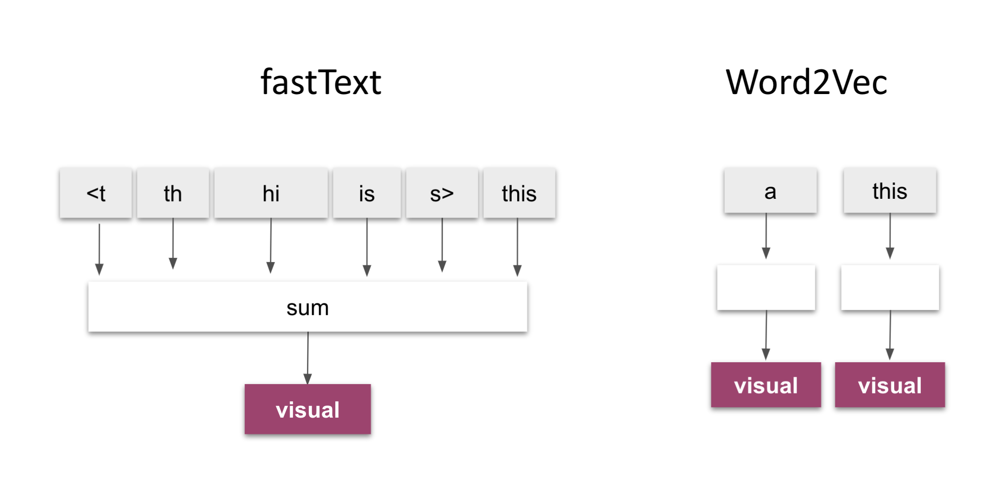

###Summarizing Skipgram Model 
Given a large training corpus represented as a sequence of words
$w_1, ..., w_T$ , the objective of the Skip-gram model is to maximize the following log-likelihood:

$ \sum_{t=1}^t \sum_{c \in C_t}^n log( p(w_c | w_t))$.

where the context $C_t$ is the set of indices of words surrounding word $w_t$ and $p(w_c | w_t)$ is the probability of observing
a context word $w_c$ given $w_t$

Dealing with performance:
- Negative Sampling
- Hierarchial softmax

So using the NG, the loss function is denoted by: 

$log(\sigma(v_{wc  }^{'T} v_{wt})) + \sum_{i=1}^k \mathbb{E}_{wi ~ P_n(w)} [log(\sigma(-v_{wi}^{'T} v_{wt}))] $


where $v_{w}$ and $v'_{w}$ are the input and output vector representation of $w$. Also, $k$ are the negative samples for each data sample and $P_{n}$ a noisy distribution .

In the word2vec model, the score between $w_{t}$ and $w_c$ is denoted by $v_{wc  }^{'T} v_{wt}$ 

On the other hand, in FastText each word $w$ is represented as a bag of character
n-gram.

For example, suppose that you are given a dictionary of n-grams of size G. Given a word w, let us denote by
$G_w ⊂ {1, . . . , G} $ the set of n-grams appearing in
w. We associate a vector representation $z_g$ to each
n-gram g. We represent a word by the sum of the
vector representations of its n-grams. We thus obtain the scoring function:
  
$s(w,c) = \sum_{g \in G_w} z_{g}^{T} v_{c}$

###Brief example trainig a FastText model using gensim library

In [ ]:
#Cleaning the dataset with the data_cleaning's methods
!pip3 install -r requirements.txt
!python -m spacy download en_core_web_sm
import data_cleaning.spanish as sp

The dataset is from wikipedia API. More info: https://www.seraph.to/python-wikipedia-2019.html

In [ ]:
import wikipedia
wikipedia.set_lang('es')

In [ ]:
ML = wikipedia.page("Aprendizaje automático").content
DL = wikipedia.page('Aprendizaje por refuerzo').content

In [ ]:
corpus = ML +DL
len(corpus)

52216

In [ ]:
corpus=sp.sentenceTokenize(corpus)

In [ ]:
cleaned_doc,entities = sp.corpus(dataset=corpus)

In [ ]:
embedding_size = 300
window_size = 12
min_word = 2
down_sampling = 1e-2

In [ ]:
from gensim.models.fasttext import FastText

"""
sentences: iterable of list of str
size: dim
min_count:the model ignores all words with total frequency lower than this.
vector_size: dimensionality of the word vectors.
window:the maximum distance between the current and predicted word within a sentence.
alpha:learning rate.
sg:training algorithm: skip-gram if sg=1, otherwise CBOW.
hs:if 1, hierarchical softmax will be used for model training. If set to 0, and negative is non-zero, negative sampling will be used.
sample:the threshold for configuring which higher-frequency words are randomly downsampled, useful range is (0, 1e-5).
"""
ft_model = FastText(cleaned_doc,
                      size=embedding_size,
                      window=window_size,
                      min_count=min_word,
                      sample=down_sampling,
                      sg=1,
                      iter=100)

In [ ]:
ft_model.corpus_count

295

In [ ]:
semantically_similar_words = {words: [item[0] for item in ft_model.wv.most_similar([words], topn=5)]
                  for words in ['regresion', 'refuerzo', 'inteligencia', 'aprendizaje', 'maquina']}

for k,v in semantically_similar_words.items():
    print(k+":"+str(v))

regresion:['densidad', 'modelado', 'soportar', 'mvs', 'k']
refuerzo:['tamano', 'error', 'aprendizaje', 'equilibrio', 'mundo']
inteligencia:['artificial', 'inteligente', 'intelligence', 'robot', 'necesidad']
aprendizaje:['automatico', 'automatizado', 'sistema', 'estrechamente', 'formado']
maquina:['soportar', 'regresion', 'densidad', 'desarrollar', 'academico']


In [ ]:
all_similar_words = sum([[k] + v for k, v in semantically_similar_words.items()], [])

print(all_similar_words)
print(type(all_similar_words))
print(len(all_similar_words))

['regresion', 'densidad', 'modelado', 'soportar', 'mvs', 'k', 'refuerzo', 'tamano', 'error', 'aprendizaje', 'equilibrio', 'mundo', 'inteligencia', 'artificial', 'inteligente', 'intelligence', 'robot', 'necesidad', 'aprendizaje', 'automatico', 'automatizado', 'sistema', 'estrechamente', 'formado', 'maquina', 'soportar', 'regresion', 'densidad', 'desarrollar', 'academico']
<class 'list'>
30


Visualizing the word embedding

In [ ]:
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

#pass the embeddings to PCA
X = ft_model[ft_model.wv.vocab]
pca = PCA(n_components=20)
pca_result = pca.fit_transform(X)

tsne = TSNE(n_components=2,perplexity=5)
result = tsne.fit_transform(pca_result)

#create df from the pca results
pca_df = pd.DataFrame(result, columns = ['x','y'])

#add the words for the hover effect
pca_df['word'] = list(ft_model.wv.vocab)
pca_df.head()


,x,y,word
0,-5.651270,17.044418,aprendizaje
1,-26.592886,27.657930,automatico
2,-29.437840,28.227768,automatizado
3,-4.537796,16.317543,maquina
4,-58.804188,-51.733051,ingl


In [ ]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt

N = 1000000
words = list(ft_model.wv.vocab)
fig = go.Figure(data=go.Scattergl(
   x = pca_df['x'],
   y = pca_df['y'],
   mode='markers',
   marker=dict(
       color=np.random.randn(N),
       colorscale='Viridis',
       line_width=1
   ),
   
   text=pca_df['word'],
   textposition="bottom center"
))

fig.show()

In [ ]:
ft_model.wv.most_similar(positive=['artificial'])

[('intelligence', 0.8504427671432495),
 ('neuronal', 0.8301974534988403),
 ('journal', 0.8141456842422485),
 ('research', 0.8083806037902832),
 ('inteligencia', 0.7965236306190491),
 ('neurona', 0.7826507687568665),
 ('profundo', 0.7578674554824829),
 ('international', 0.721123456954956),
 ('ronald', 0.7109283208847046),
 ('networks', 0.694907546043396)]

#Loading a pre train word embedding in [spanish ](https://github.com/dccuchile/spanish-word-embeddings)

In [31]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=2d549aaceb865e2c077e6ec359fc7bb4eb4285ea11f8fa2bfe58895c5d201913
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [32]:
import gensim
import gensim.downloader as api
from gensim.models import KeyedVectors

In [33]:
import wget
wget.download('https://dl.fbaipublicfiles.com/fasttext/vectors-wiki/wiki.es.vec')

'wiki.es.vec'

In [36]:
wv = gensim.models.KeyedVectors.load_word2vec_format('wiki.es.vec', binary=False)

In [37]:
wv.vector_size

300

In [38]:
len(wv.vocab)

985667

In [39]:
result = wv.most_similar(positive=['hombre', 'reina'], negative=['rey'], topn=5)
print(result)

[('mujer', 0.6295130252838135), ('mujer…', 0.5689319372177124), ('hombre…', 0.5659158825874329), ('mujer―', 0.5506100058555603), ('mujer/hombre', 0.5375671982765198)]


In [42]:
wv.most_similar(positive=['artificial'])

[('bioartificial', 0.7891689538955688),
 ('artificial»', 0.7790473699569702),
 ('artificial—', 0.763886034488678),
 ('artificialmente', 0.7551352977752686),
 ('artificials', 0.7375409603118896),
 ('artificiale', 0.723944902420044),
 ('bioartificiales', 0.6945717334747314),
 ('artificiales»', 0.6901886463165283),
 ('artificialidad', 0.6829676032066345),
 ('artificially', 0.6817296743392944)]